In [61]:
import pandas as pd
import tigramite
from tigramite import data_processing as pp
from tigramite.toymodels import structural_causal_processes as toys
from tigramite import plotting as tp
from tigramite.independence_tests.robust_parcorr import RobustParCorr
from tigramite.lpcmci import LPCMCI
from tigramite.pcmci import PCMCI
from tigramite.independence_tests.gpdc import GPDC
from tigramite.independence_tests.parcorr import ParCorr
from tigramite.independence_tests.regressionCI import RegressionCI
from tigramite.independence_tests.cmiknn import CMIknn
from utils.stat_dyn_graph_tranform import get_symbol_with_indices, static_graph_with_lag_info, stat_to_dy_graph
from run_user_temp import run_user


In [63]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [64]:
var_names = ['bld_vol', 'sbp', 'dbp', 'heart_rate', 'resp_rate', 'eda', 'tmp_skin', 'hrt_var', 'spo2']
patient_497 = pd.read_csv('data/497_360_int.csv')
dataframe_497 = pp.DataFrame(patient_497.values, var_names=var_names)
patient_372 = pd.read_csv('data/372_360_int.csv')
dataframe_372 = pp.DataFrame(patient_372.values, var_names=var_names)
patient_603 = pd.read_csv('data/603_360_int.csv')
dataframe_603 = pp.DataFrame(patient_603.values, var_names=var_names)

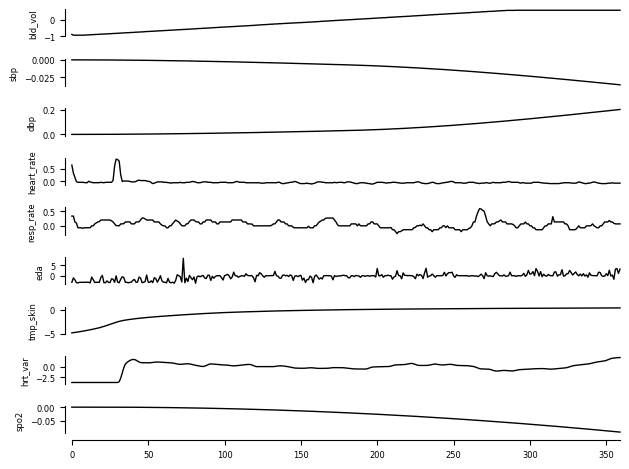

In [65]:
import matplotlib.pyplot as plt
data = patient_372
tp.plot_timeseries(dataframe_372, save_name='out/372_data.pdf', label_fontsize=6); plt.show()

#### set link assumption

In [66]:
tau_max = 30
link_assumptions = {j:{(i, -tau):'o?o' for i in range(9) for tau in range(tau_max + 1) if (i, -tau) != (j, 0)} 
                            for j in range(9)}
link_assumptions[0] = {}
# link_assumptions[0] = {(0, -tau):'o?o' for tau in range(1, tau_max + 1)}

for j in range(1, 9):
        for tau in range(tau_max+1):
            if tau != 0:
                link_assumptions[j][0, -tau] = '-?>'
        link_assumptions[j][0, 0] = '-?>'
link_assumptions[2][(5, -1)] = '<--'
link_assumptions[5][(2, -1)] = '-->'

#### specify algorithm and some parameters

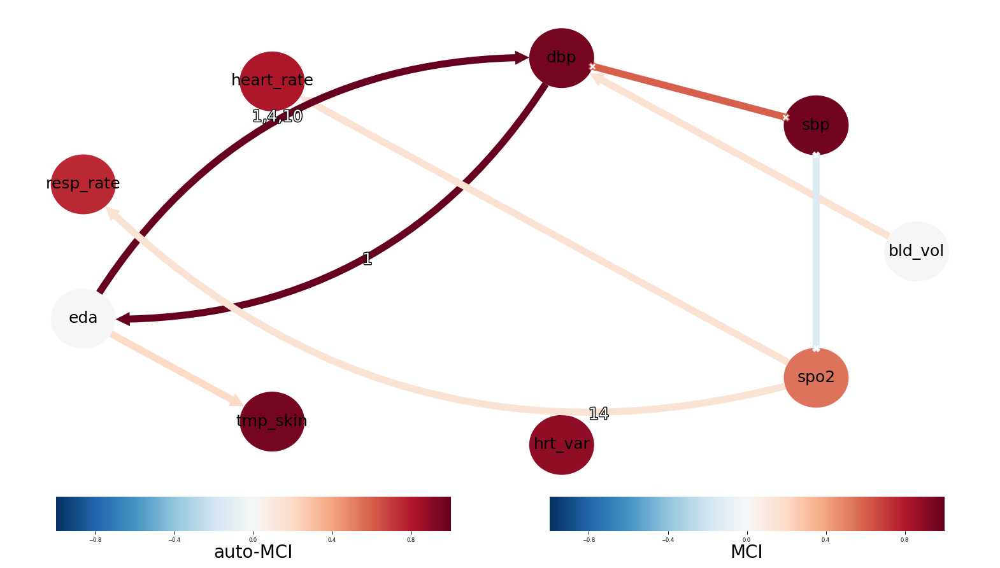

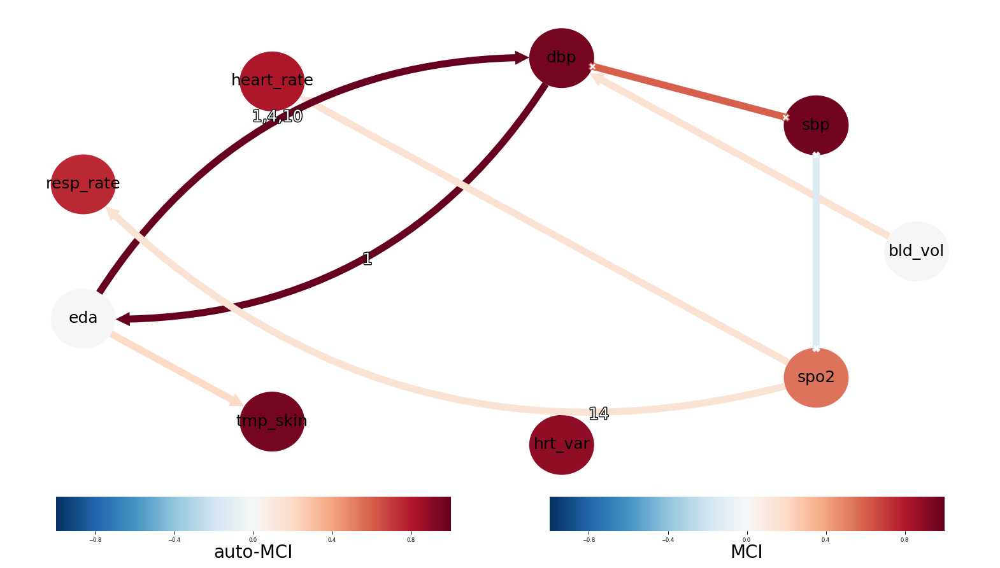

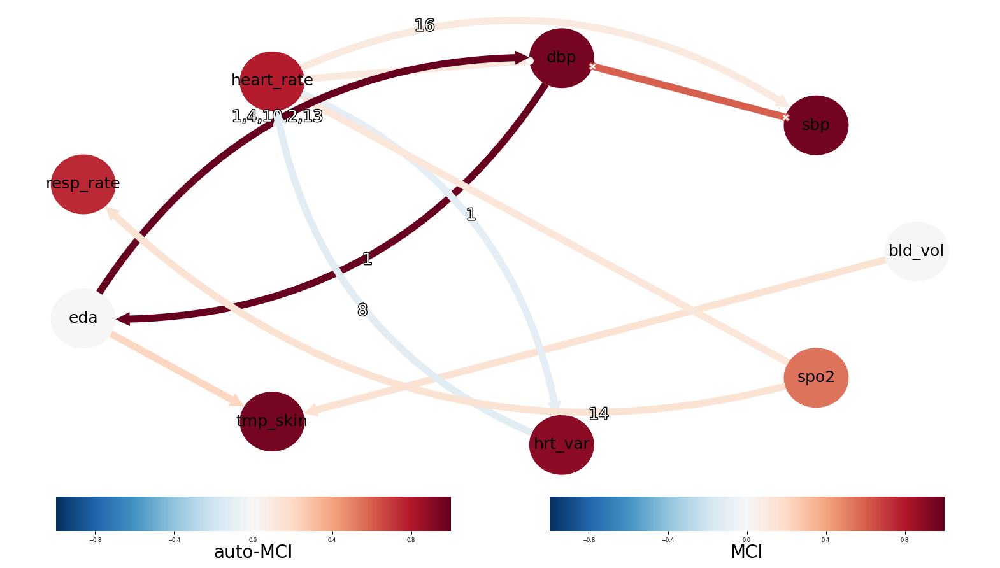

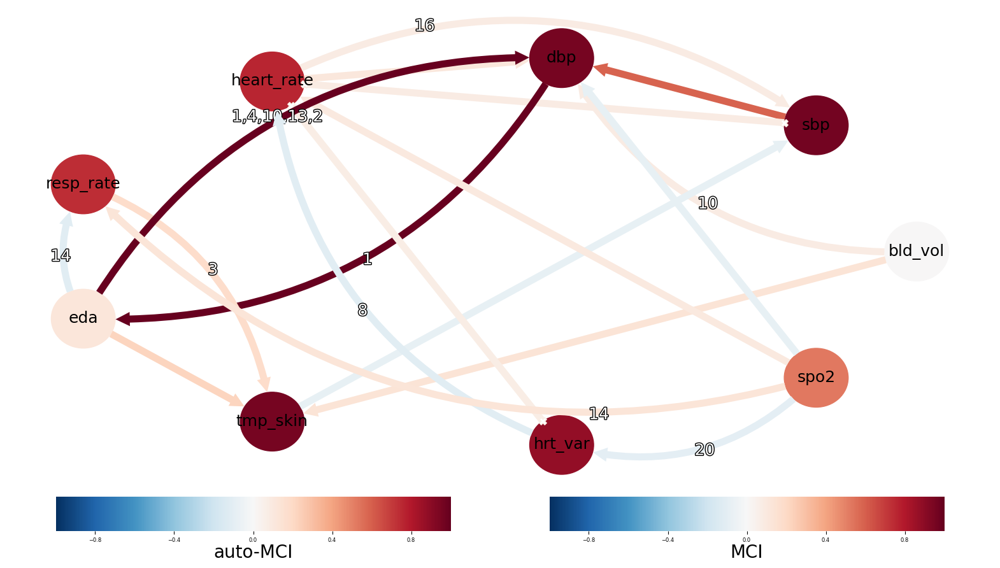

In [67]:
tau_max = 30
            
method_arg = {
    'tau_max':30,
    'link_assumptions': link_assumptions,
    'sig_level': [None, 0.05, 0.1, 0.2],
    'shuffle_times': 1
} 
plotting_arg = {
    'plotting_cor': True,
    'plotting_ind_graph': True,
    'plotting_graph': True,
    'method': 'pcmci'
}

cit_method = 'parcorr'
data = patient_497
result_497 = run_user(data, var_names, 497, cit_method, method_arg, plotting_arg)

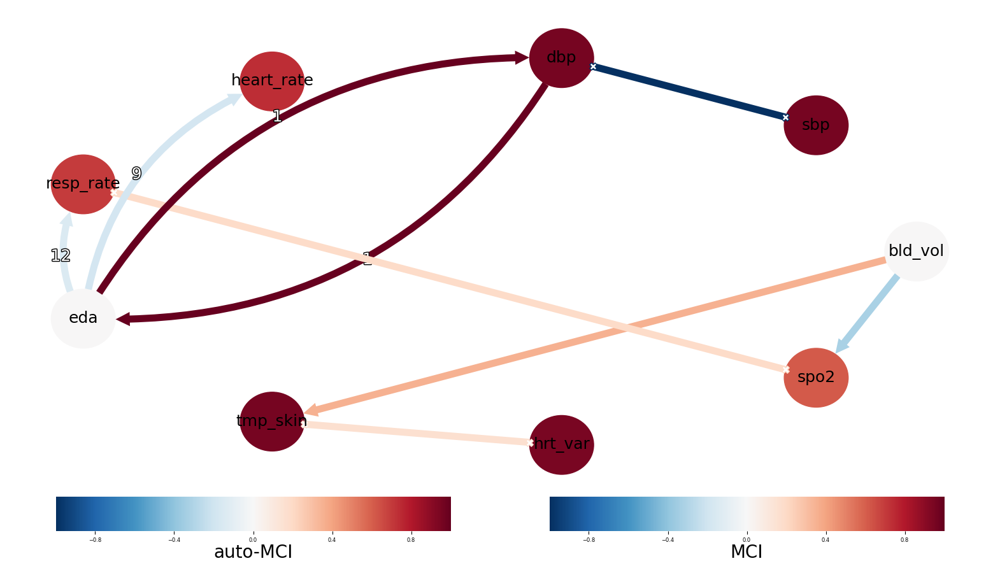

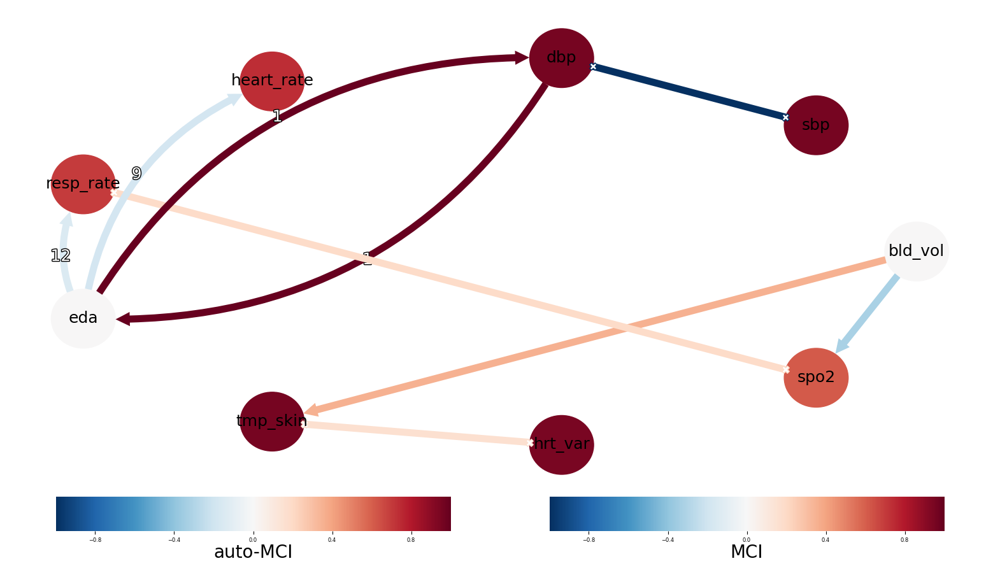

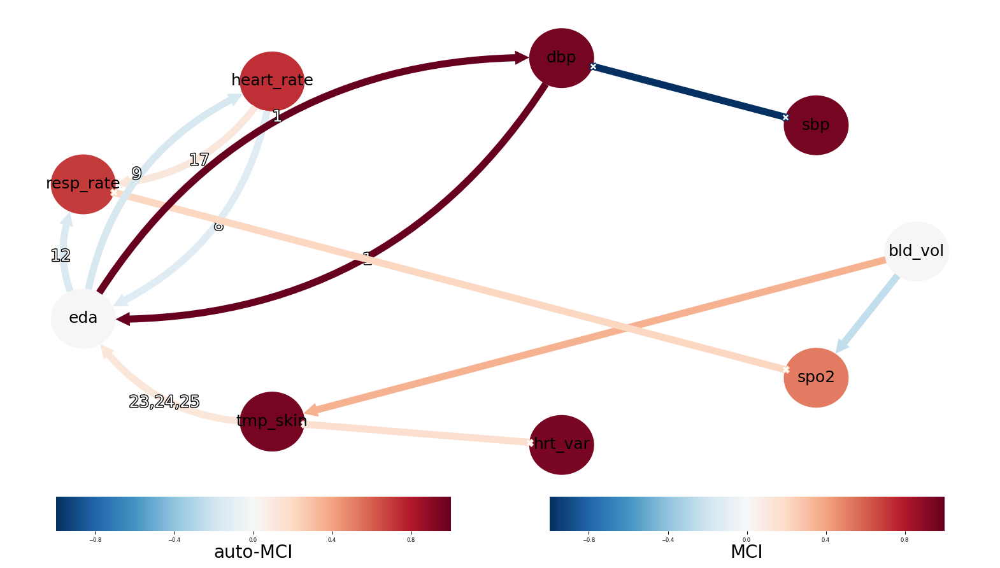

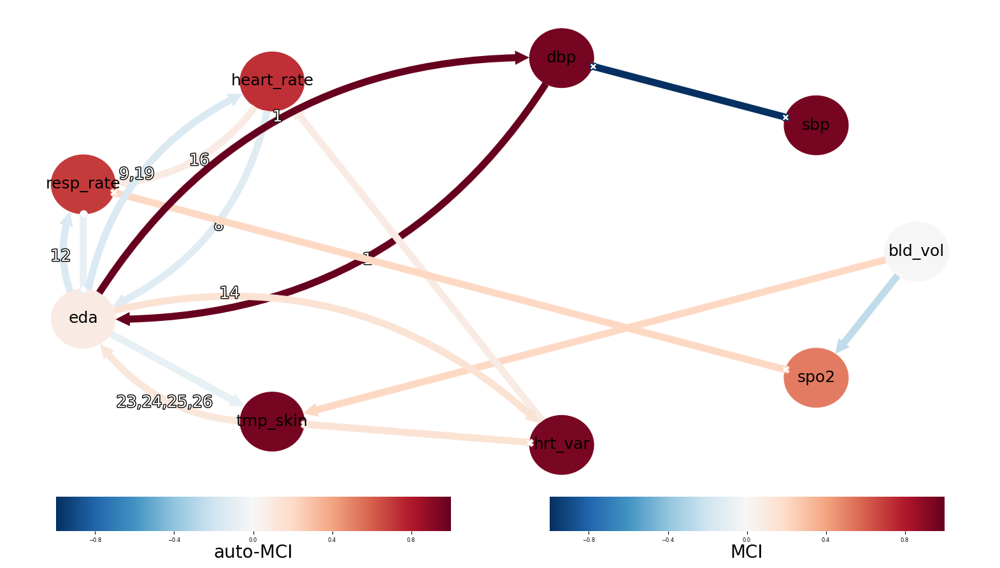

In [68]:
tau_max = 30           
            
method_arg = {
    'tau_max':30,
    'link_assumptions': link_assumptions,
    'sig_level': [None, 0.05, 0.1, 0.2],
    'shuffle_times': 0
} 
plotting_arg = {
    'plotting_cor': True,
    'plotting_ind_graph': True,
    'plotting_graph': True,
    'method': 'pcmci'
}

cit_method = 'parcorr'
data = patient_372
results_372 = run_user(data, var_names, 372, cit_method, method_arg, plotting_arg)

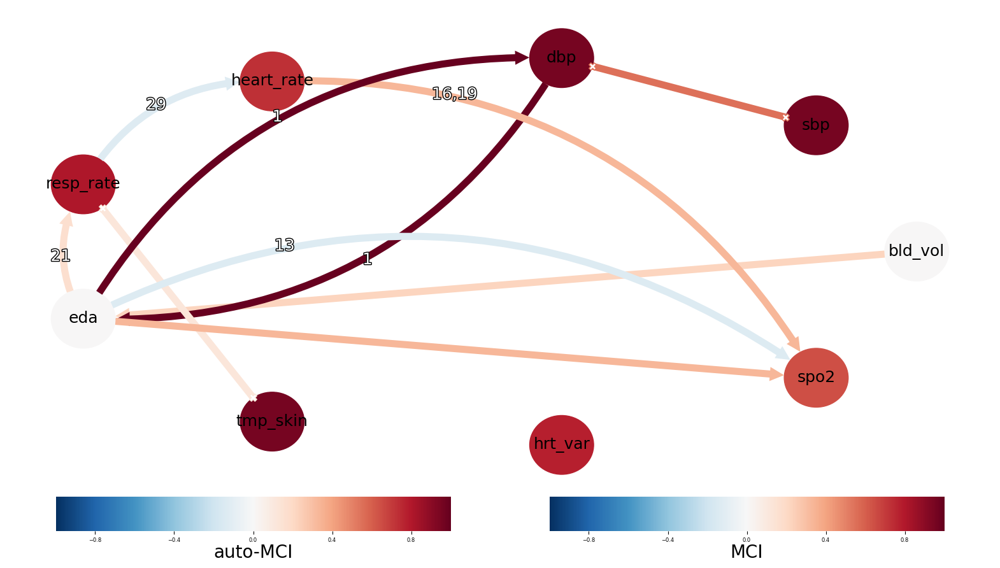

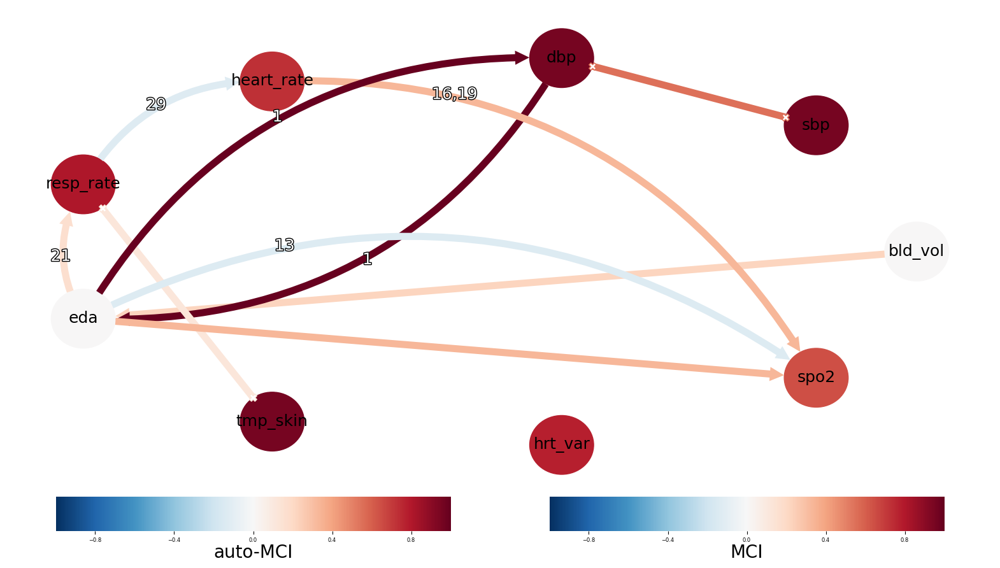

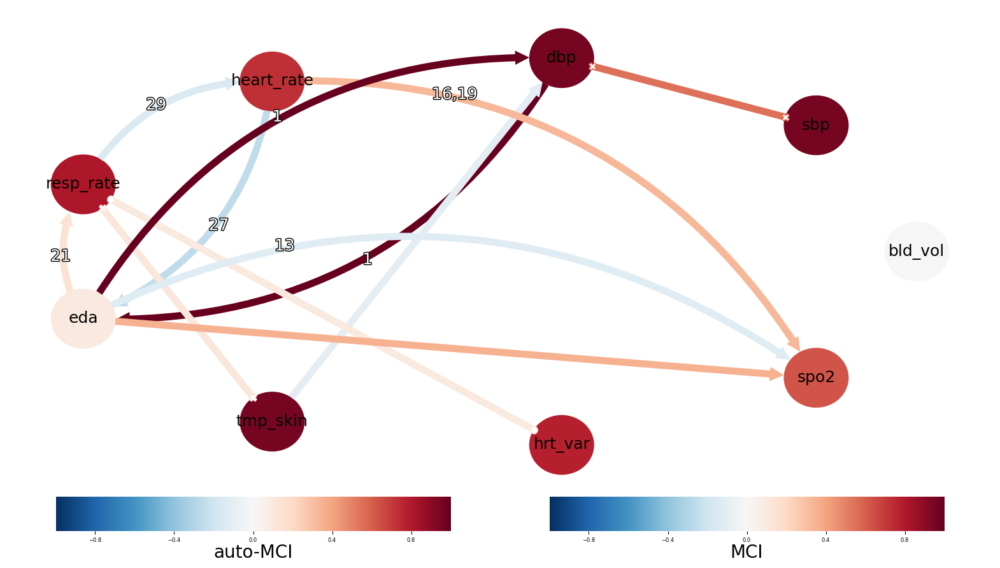

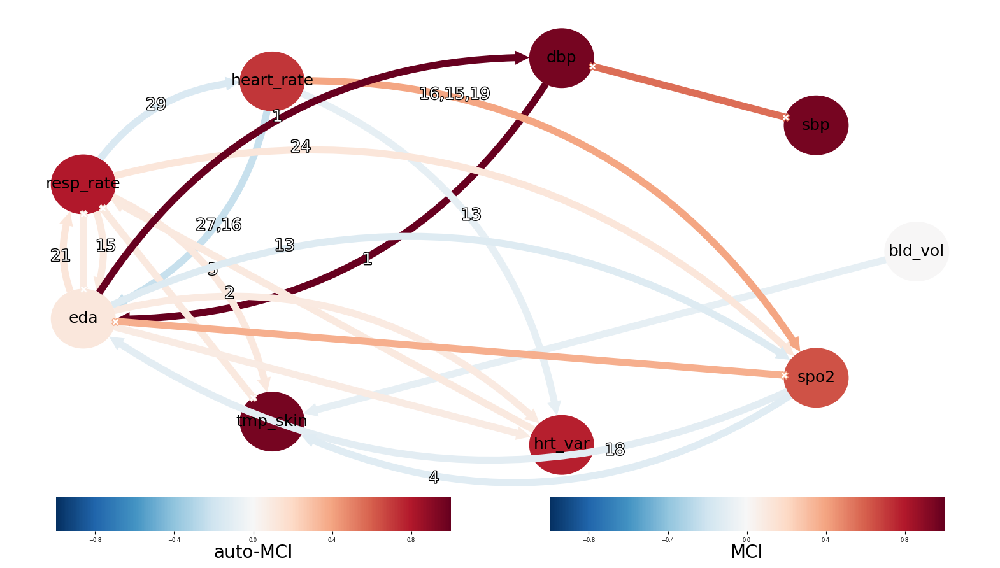

In [69]:
tau_max = 30           
            
method_arg = {
    'tau_max':30,
    'link_assumptions': link_assumptions,
    'sig_level': [None, 0.05, 0.1, 0.2],
    'shuffle_times': 0
} 
plotting_arg = {
    'plotting_cor': True,
    'plotting_ind_graph': True,
    'plotting_graph': True,
    'method': 'pcmci'
}

cit_method = 'parcorr'
data = patient_603
results_603 = run_user(data, var_names, 603, cit_method, method_arg, plotting_arg)

#### Graph Aggregation

In [70]:
user_pool = [result_497[1]['graph'], result_497[1]['graph'], result_497[1]['graph'], 
             result_497[3]['graph'], result_497[0]['graph'], result_497[1]['graph'], 
            results_372_gpdc[0]['graph'], results_372_gpdc[1]['graph'],
            results_603[0]['graph'], results_603[1]['graph']
            ]

##### Plotting

/Users/binlanwu/Downloads/TUM/5.Master_Thesis_eth/graphical_modeling/data/dynamic-causal-discovery/utils/stat_dyn_graph_tranform.py:35: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  agg_graph = stats.mode(pend_graph, axis=0).mode.squeeze()
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret

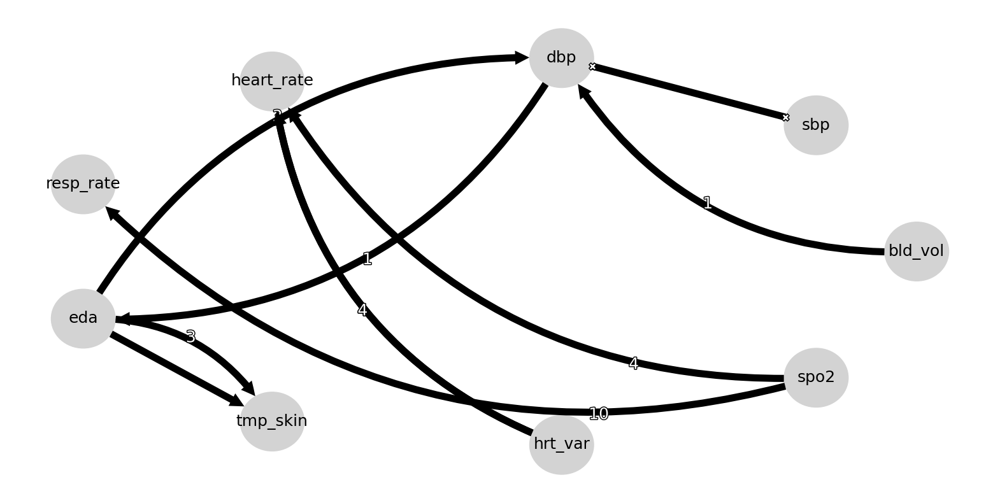

In [71]:
graph, index = static_graph_with_lag_info(user_pool, data.shape[1])
aggregated_array = stat_to_dy_graph(graph, index, tau_max+1)
aggregated_array[3][(7, 4)] = '<--'
aggregated_array[7][(3, 4)] = '-->'
tp.plot_graph(aggregated_array, figsize = (20, 10), save_name = 'out/'+'final_agg2'+ '_'+'.pdf', 
          show_colorbar=True, node_size = 0.3, label_fontsize=20, node_label_size=18, 
          link_label_fontsize=18, curved_radius=0.3, var_names=var_names)

In [ ]:
#dynamic graph

In [72]:
# # Plot time series graph    
# tp.plot_time_series_graph(
#     figsize=(16, 12),
#     node_size = 0.01,
# #     val_matrix=results['val_matrix'],
#     save_name = 'out/'+'_time_final_agg2'+ '_'+'.pdf',
#     graph=aggregated_array,
#     var_names=var_names,
#     link_colorbar_label='MCI',
#     ); plt.show()

#### Random Forest cit

In [6]:
from regression import Regression

In [8]:
from tigramite.pcmci import PCMCI
data = patient_372
data_type = np.zeros(data.shape, dtype='int')
dataframe = pp.DataFrame(data.values,
                         data_type=data_type,
                         var_names=data.columns)
cit = Regression(significance='analytic')
pcmci_rf = PCMCI(
                dataframe=dataframe,
                cond_ind_test=cit,
                verbosity=0)

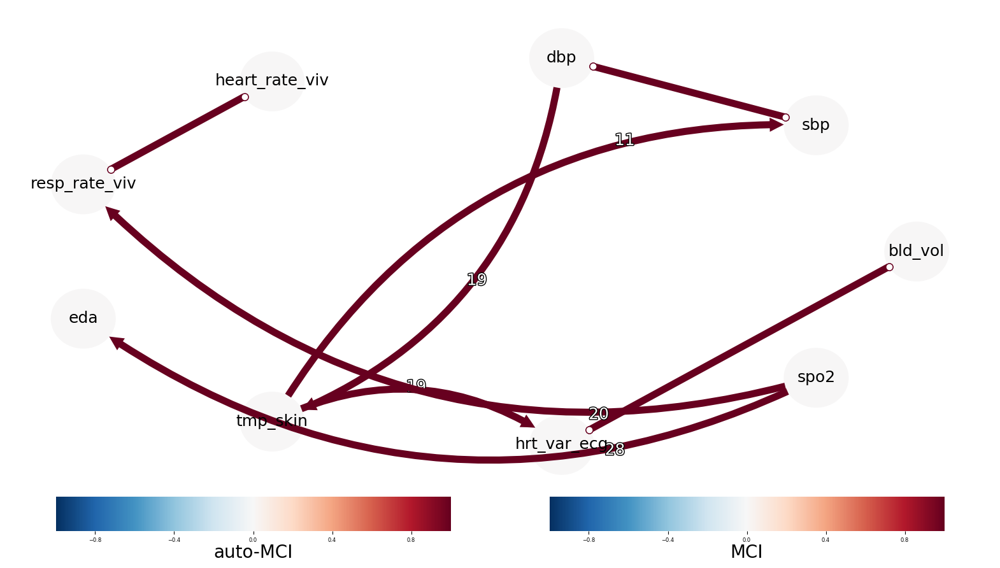

In [14]:
from tigramite import plotting as tp
tp.plot_graph(res_rf['graph'], val_matrix=res_rf['val_matrix'], figsize = (20, 10),
                         show_colorbar=True,  save_name='372_random_forest_scai_0.2.pdf',
                          node_size = 0.3, label_fontsize=20, node_label_size=18, link_label_fontsize=18, 
                          curved_radius=0.3, var_names=var_names)

In [73]:
from tigramite.independence_tests.parcorr import ParCorr
pcmci_497 = PCMCI(
                dataframe=dataframe_497,
                cond_ind_test=ParCorr(),
                verbosity=0)


In [ ]:
import matplotlib.pyplot as plt
window_step=80
window_length=120
sig_level = [0.1]

for pc_alpha in sig_level:
    method='run_pcmciplus'
    method_args={'tau_min':0, 'tau_max':30, 'pc_alpha':pc_alpha, 'link_assumptions':link_assumptions}
    conf_lev = 0.95
#     print('hi')
    results_497 = pcmci_497.run_sliding_window_of(method=method,
                                        method_args=method_args,
                                        window_step=window_step,
                                        window_length=window_length,
                                        conf_lev = conf_lev)
    
    graphs_497 = results_497['window_results']['graph']
    val_matrices_497 = results_497['window_results']['val_matrix']
    n_windows = len(graphs_497)

    mosaic = [['data %s' %j for i in range(n_windows)] for j in range(9)]
    for n in range(9):
        mosaic.append(['graph %s' %i for i in range(n_windows)])
    # print(mosaic)
    fig, axs = plt.subplot_mosaic(mosaic = mosaic, figsize=(30, 20))

    for j in range(9):
        ax = axs['data %s' %j]
        ax.axhline(0., color='grey')
        color = 'blue'
        ax.plot(np.arange(patient_497['hrt_var_ecg'].values.shape[0]), patient_497.iloc[:,j], color=color)
    #     axs['data %s' %j].axis('off') # xaxis.set_ticklabels([])
        for loc, spine in ax.spines.items():
            if loc != 'left':
                spine.set_color("none")

        ax.xaxis.set_ticks([])
        ax.set_xlim(0., patient_497['hrt_var_ecg'].values.shape[0])
        ax.set_ylabel(var_names[j])

    for w in range(n_windows):
        if w == 0: show_colorbar=True
        else: show_colorbar = False
        tp.plot_graph(graphs_497[w], val_matrix=val_matrices_497[w], save_name = 'out/497_sw_gdpc_'+str(pc_alpha)+'.pdf',
                      show_colorbar=show_colorbar, node_label_size=20, link_label_fontsize=15, figsize = (20, 10),
                      var_names=var_names, fig_ax=(fig, axs['graph %s' %w]))

In [58]:
link_assumptions

{0: {(0, -1): '',
  (0, -2): '',
  (0, -3): '',
  (0, -4): '',
  (0, -5): '',
  (0, -6): '',
  (0, -7): '',
  (0, -8): '',
  (0, -9): '',
  (0, -10): '',
  (0, -11): '',
  (0, -12): '',
  (0, -13): '',
  (0, -14): '',
  (0, -15): '',
  (0, -16): '',
  (0, -17): '',
  (0, -18): '',
  (0, -19): '',
  (0, -20): '',
  (0, -21): '',
  (0, -22): '',
  (0, -23): '',
  (0, -24): '',
  (0, -25): '',
  (0, -26): '',
  (0, -27): '',
  (0, -28): '',
  (0, -29): '',
  (0, -30): '',
  (1, 0): '',
  (1, -1): '',
  (1, -2): '',
  (1, -3): '',
  (1, -4): '',
  (1, -5): '',
  (1, -6): '',
  (1, -7): '',
  (1, -8): '',
  (1, -9): '',
  (1, -10): '',
  (1, -11): '',
  (1, -12): '',
  (1, -13): '',
  (1, -14): '',
  (1, -15): '',
  (1, -16): '',
  (1, -17): '',
  (1, -18): '',
  (1, -19): '',
  (1, -20): '',
  (1, -21): '',
  (1, -22): '',
  (1, -23): '',
  (1, -24): '',
  (1, -25): '',
  (1, -26): '',
  (1, -27): '',
  (1, -28): '',
  (1, -29): '',
  (1, -30): '',
  (2, 0): '',
  (2, -1): '',
  (2, -2): '

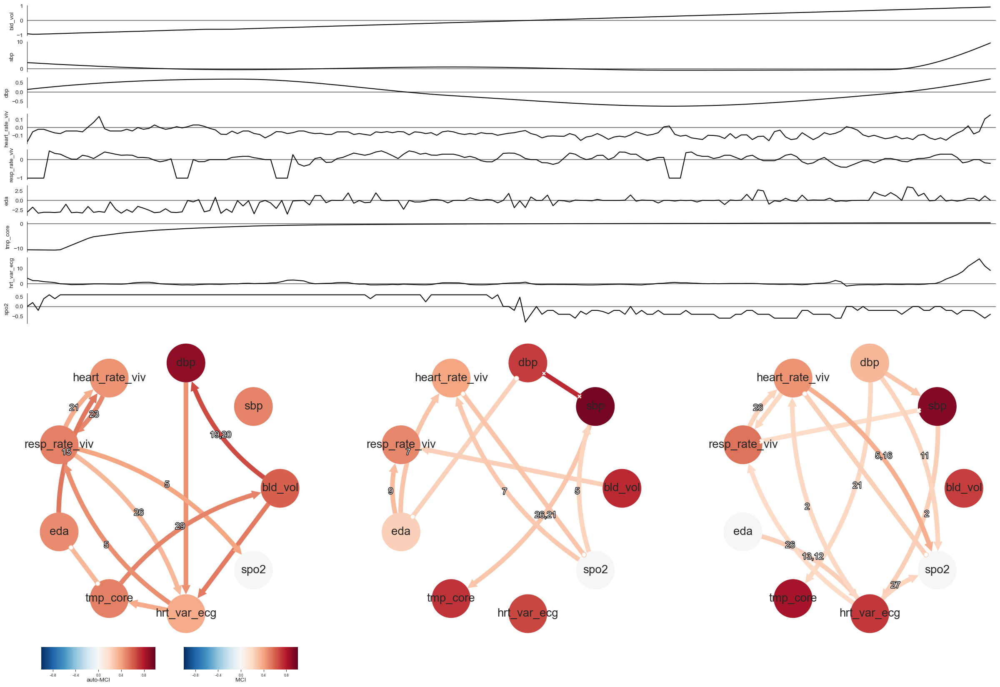

In [116]:
import matplotlib.pyplot as plt
graphs_497 = results_497['window_results']['graph']
val_matrices_497 = results_497['window_results']['val_matrix']
n_windows = len(graphs_497)

mosaic = [['data %s' %j for i in range(n_windows)] for j in range(9)]
for n in range(9):
    mosaic.append(['graph %s' %i for i in range(n_windows)])
# print(mosaic)
fig, axs = plt.subplot_mosaic(mosaic = mosaic, figsize=(30, 20))

for j in range(9):
    ax = axs['data %s' %j]
    ax.axhline(0., color='grey')
    color = 'blue'
    ax.plot(np.arange(patient_497['hrt_var_ecg'].values.shape[0]), patient_497.iloc[:,j], color=color)
#     axs['data %s' %j].axis('off') # xaxis.set_ticklabels([])
    for loc, spine in ax.spines.items():
        if loc != 'left':
            spine.set_color("none")

    ax.xaxis.set_ticks([])
    ax.set_xlim(0., patient_497['hrt_var_ecg'].values.shape[0])
    ax.set_ylabel(var_names[j])

for w in range(n_windows):
    if w == 0: show_colorbar=True
    else: show_colorbar = False
    tp.plot_graph(graphs_497[w], val_matrix=val_matrices_497[w], save_name = '497_sw_0.2.svg',
                  show_colorbar=show_colorbar, node_label_size=20, link_label_fontsize=15, figsize = (20, 10),
                  var_names=var_names, fig_ax=(fig, axs['graph %s' %w]))

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


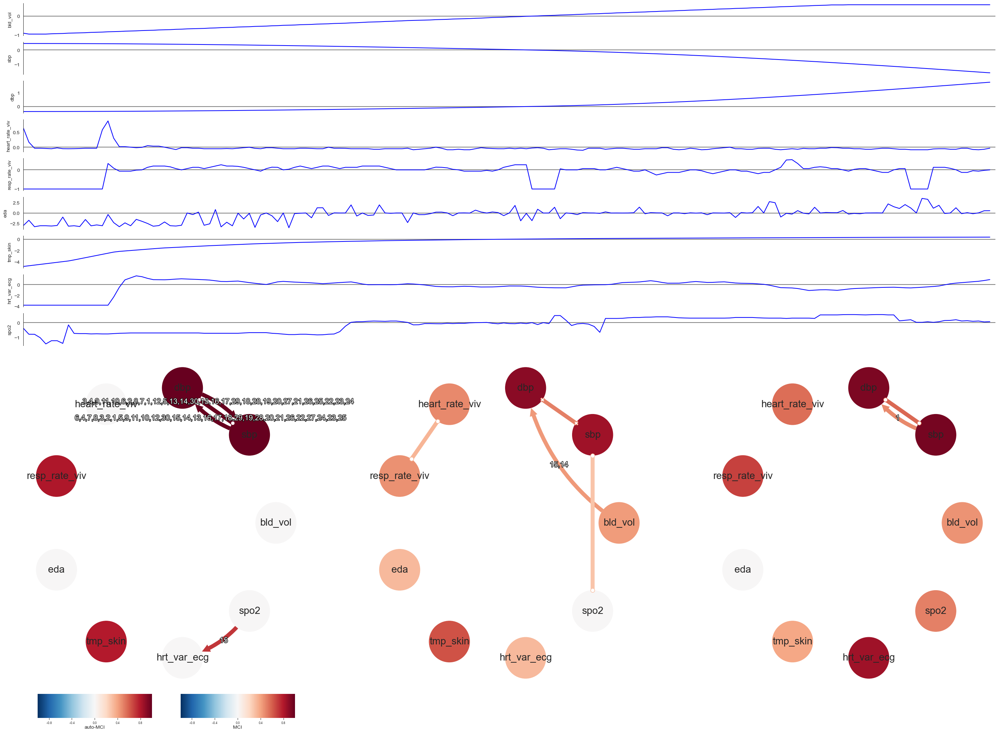

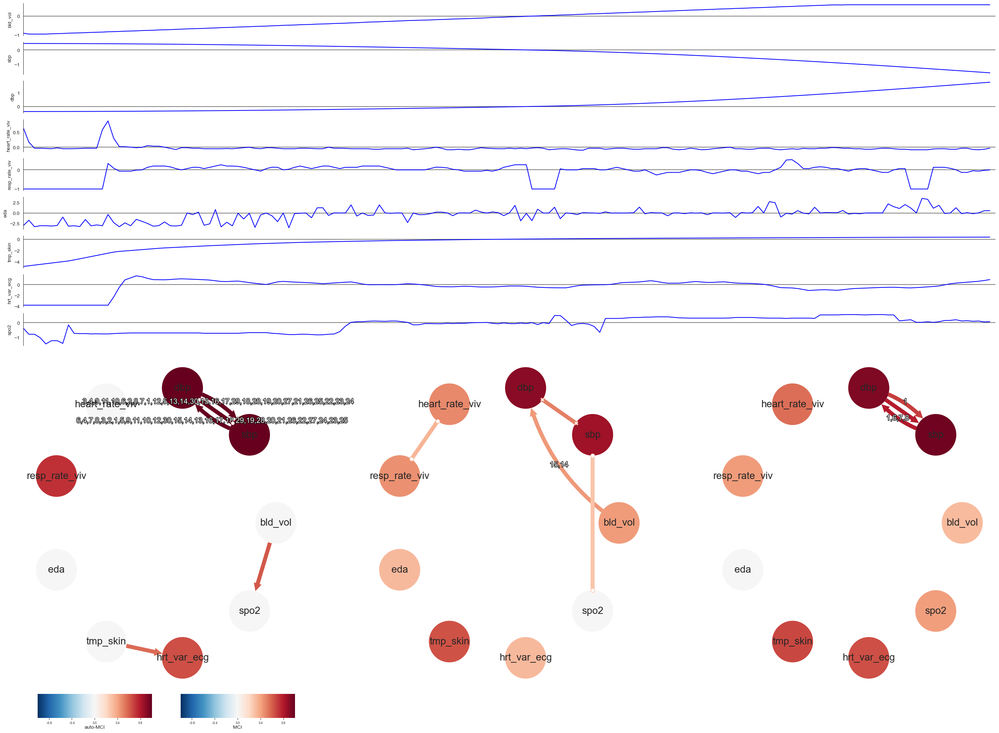

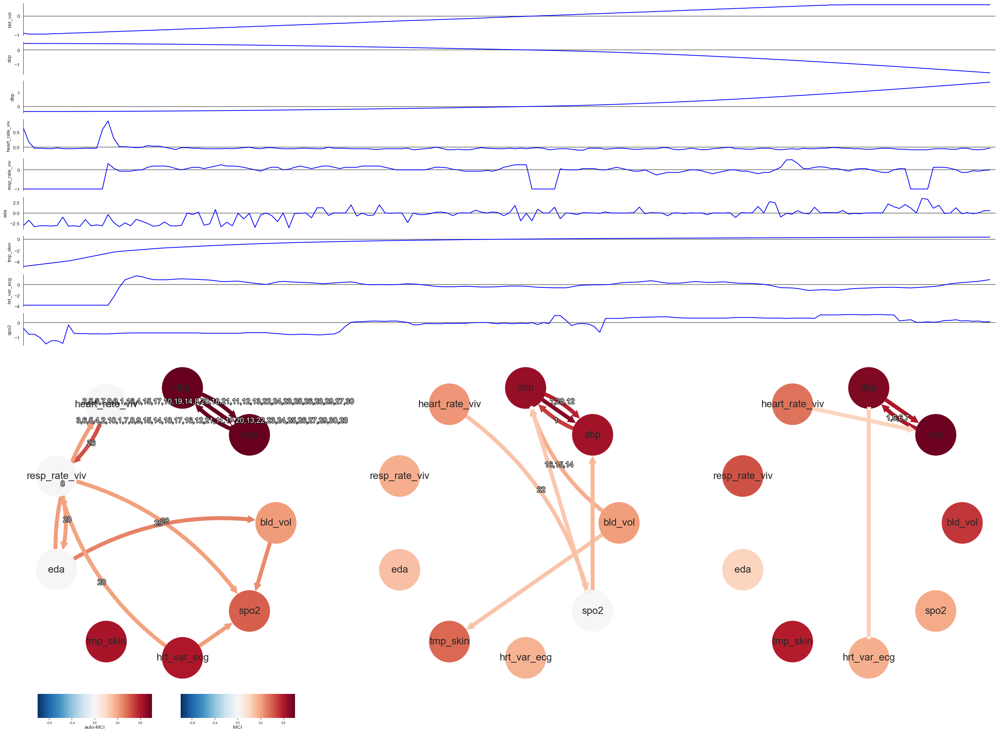

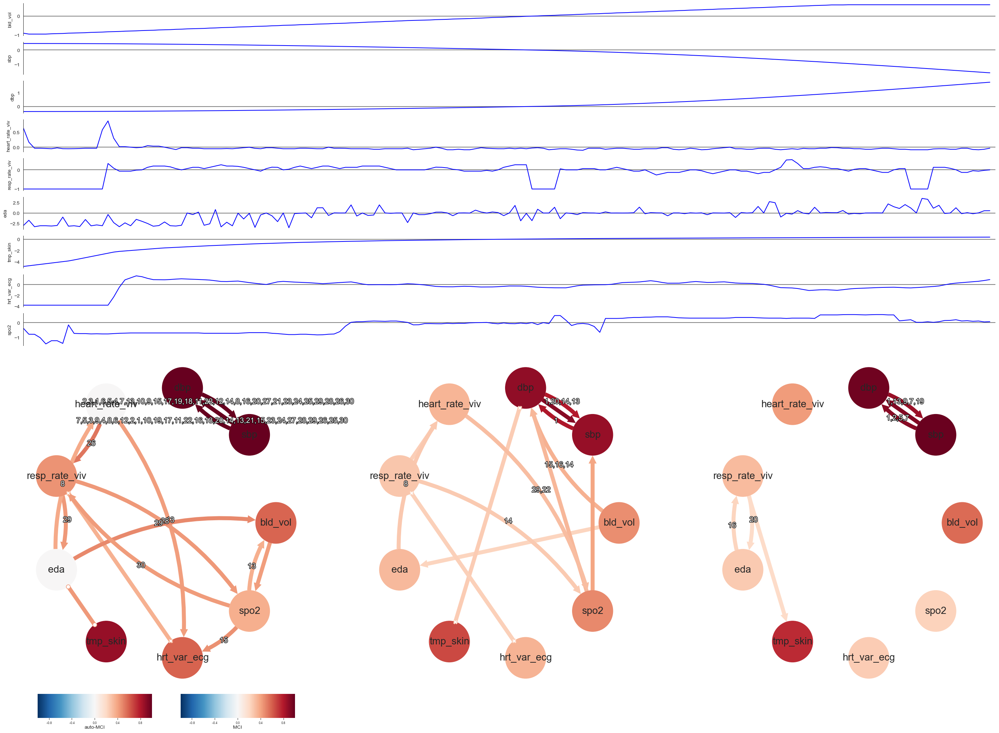

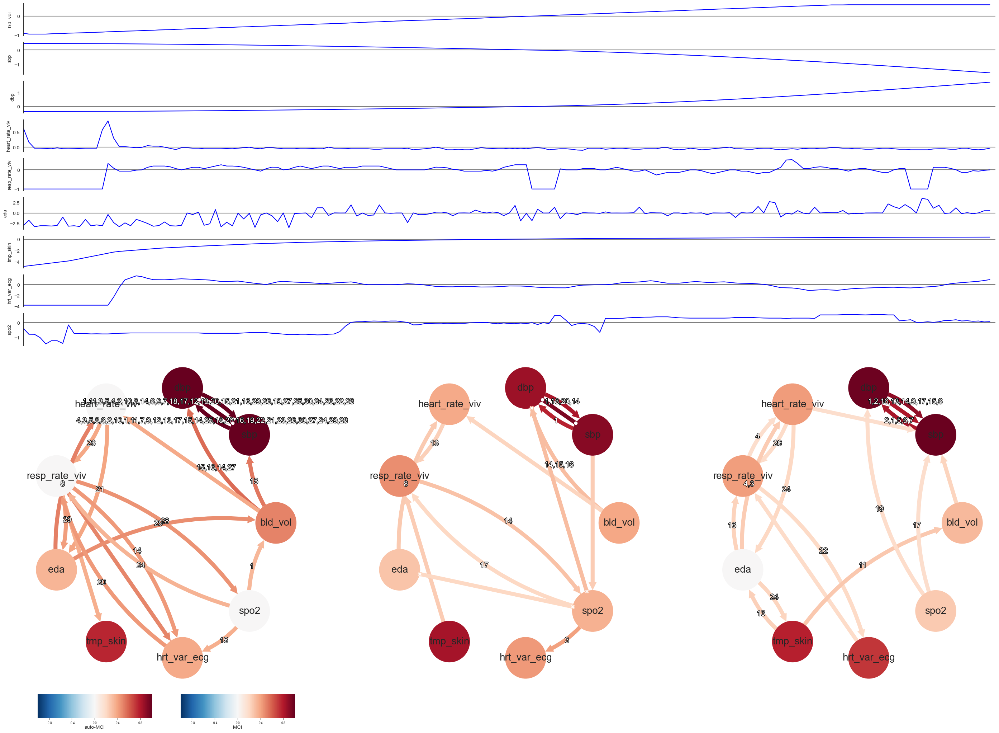

In [148]:
window_step=40
window_length=90
method='run_pcmciplus'

link_assumption[0] = {}
for pc_alpha in sig_level:
    method_args={'tau_min':0, 'tau_max':30, 'pc_alpha':pc_alpha, 'link_assumptions':link_assumptions}
    conf_lev = 0.95

    # Run
    results_372 = pcmci_gpdc_372.run_sliding_window_of(method=method,
                                        method_args=method_args,
                                        window_step=window_step,
                                        window_length=window_length,
    #                                     link_assumptions=link_assumptions,
                                        conf_lev = conf_lev)
    
    graphs_372 = results_372['window_results']['graph']
    val_matrices_372 = results_372['window_results']['val_matrix']
    n_windows = len(graphs_372)

    mosaic = [['data %s' %j for i in range(n_windows)] for j in range(9)]
    for n in range(9):
        mosaic.append(['graph %s' %i for i in range(n_windows)])
    # print(mosaic)
    fig, axs = plt.subplot_mosaic(mosaic = mosaic, figsize=(35, 25))

    for j in range(9):
        ax = axs['data %s' %j]
        ax.axhline(0., color='grey')
        color = 'blue'
        ax.plot(np.arange(patient_372.values.shape[0]), patient_372.iloc[:,j], color=color)
    #     axs['data %s' %j].axis('off') # xaxis.set_ticklabels([])
        for loc, spine in ax.spines.items():
            if loc != 'left':
                spine.set_color("none")

        ax.xaxis.set_ticks([])
        ax.set_xlim(0., 360)
        ax.set_ylabel(var_names[j])

    for w in range(n_windows):
        if w == 0: show_colorbar=True
        else: show_colorbar = False
        tp.plot_graph(graphs_372[w], val_matrix=val_matrices_372[w], save_name = '372_sw_'+str(pc_alpha)+'.svg',
                      show_colorbar=show_colorbar, node_label_size=20, link_label_fontsize=15, figsize = (20, 10),
                      var_names=var_names, fig_ax=(fig, axs['graph %s' %w]))


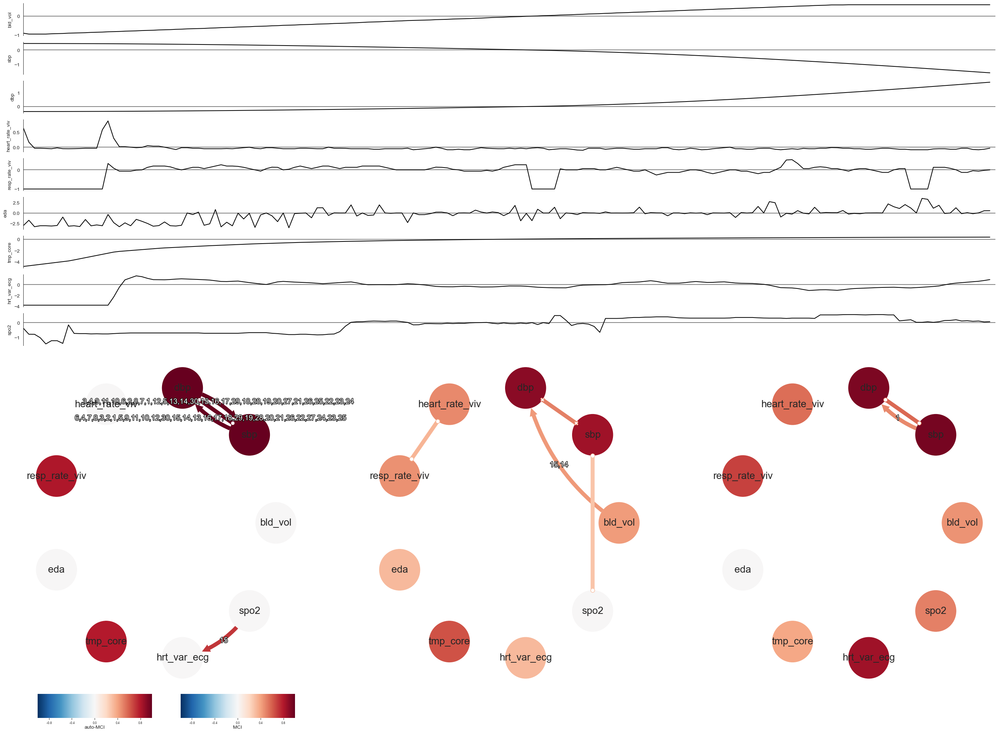

In [125]:
import matplotlib.pyplot as plt
graphs_372 = results_372['window_results']['graph']
val_matrices_372 = results_372['window_results']['val_matrix']
n_windows = len(graphs_372)

mosaic = [['data %s' %j for i in range(n_windows)] for j in range(9)]
for n in range(9):
    mosaic.append(['graph %s' %i for i in range(n_windows)])
# print(mosaic)
fig, axs = plt.subplot_mosaic(mosaic = mosaic, figsize=(35, 25))

for j in range(9):
    ax = axs['data %s' %j]
    ax.axhline(0., color='grey')
    color = 'blue'
    ax.plot(np.arange(patient_372.values.shape[0]), patient_372.iloc[:,j], color=color)
#     axs['data %s' %j].axis('off') # xaxis.set_ticklabels([])
    for loc, spine in ax.spines.items():
        if loc != 'left':
            spine.set_color("none")

    ax.xaxis.set_ticks([])
    ax.set_xlim(0., patient_372['hrt_var_ecg'].values.shape[0])
    ax.set_ylabel(var_names[j])

for w in range(n_windows):
    if w == 0: show_colorbar=True
    else: show_colorbar = False
    tp.plot_graph(graphs_372[w], val_matrix=val_matrices_372[w], save_name = '372_sw_none.svg',
                  show_colorbar=show_colorbar, node_label_size=20, link_label_fontsize=15, figsize = (20, 10),
                  var_names=var_names, fig_ax=(fig, axs['graph %s' %w]))

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better valu

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bou

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bo

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/tigramite/independence_tests/gpdc.py:216: UserWarning: Possibly constant array!
  warnings.warn("Possibly constant array!")
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/tigramite/independence_tests/gpdc.py:216

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/tigramite/independence_tests/gpdc.py:216: UserWarning: Possibly constant array!
  warnings.warn("Possibly constant array!")
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/tigramite/independence_tests/gpdc.py:216: UserWarning: Possibly constant array!
  warnings.warn("Possibly constant array!")
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. D

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bou

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bou

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/mod

/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/binlanwu/opt/miniconda3/envs/graphical_mod/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


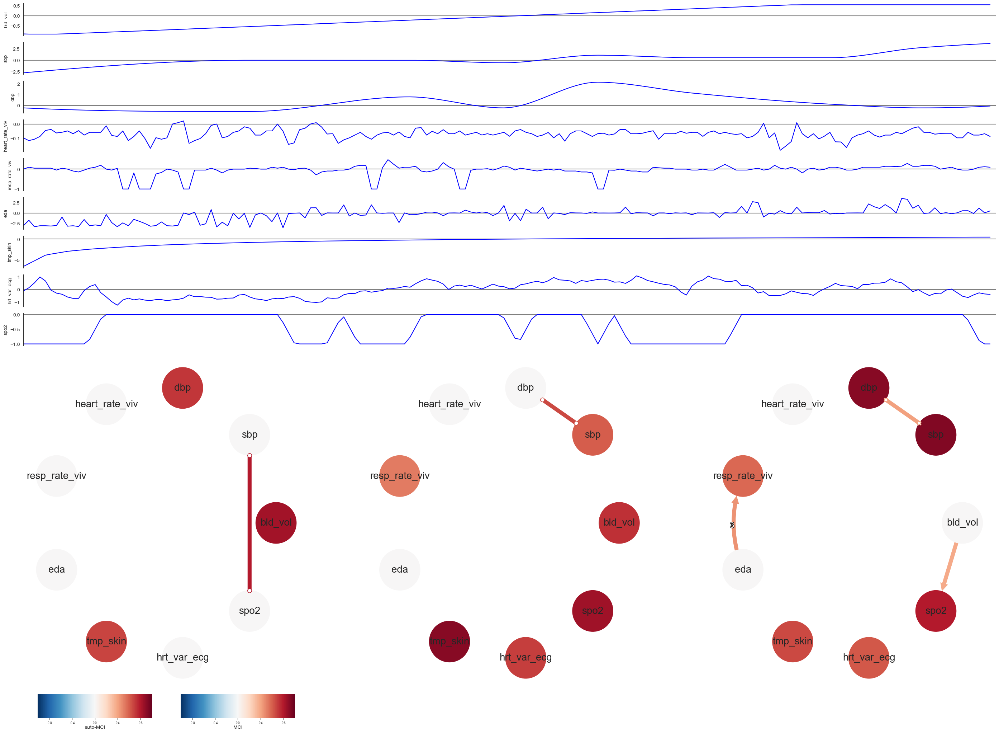

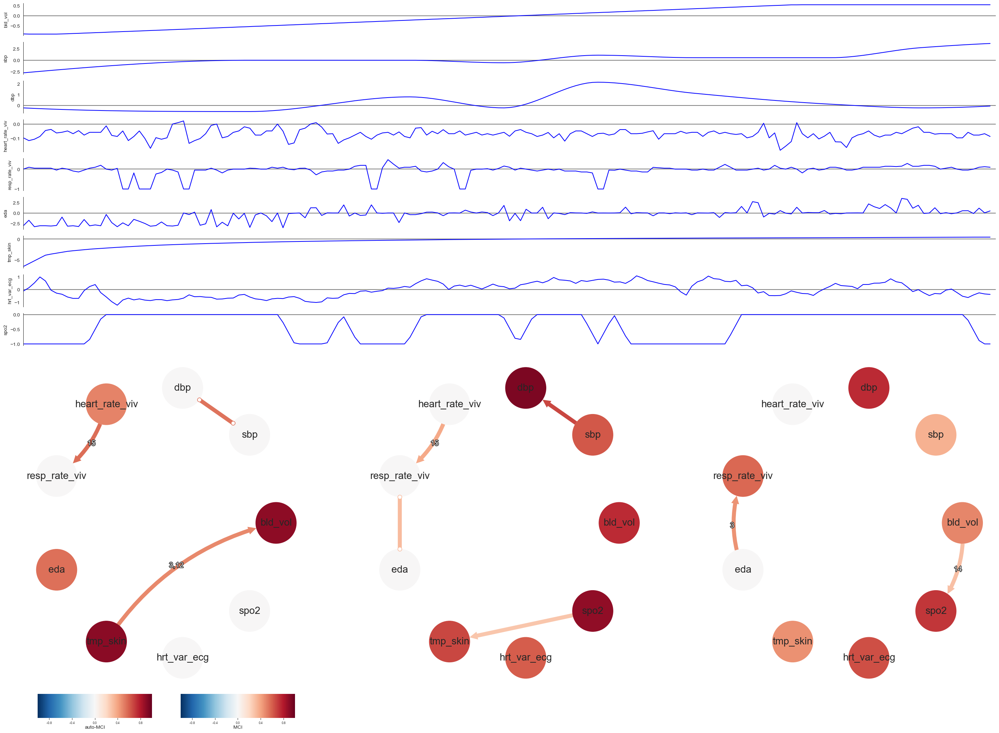

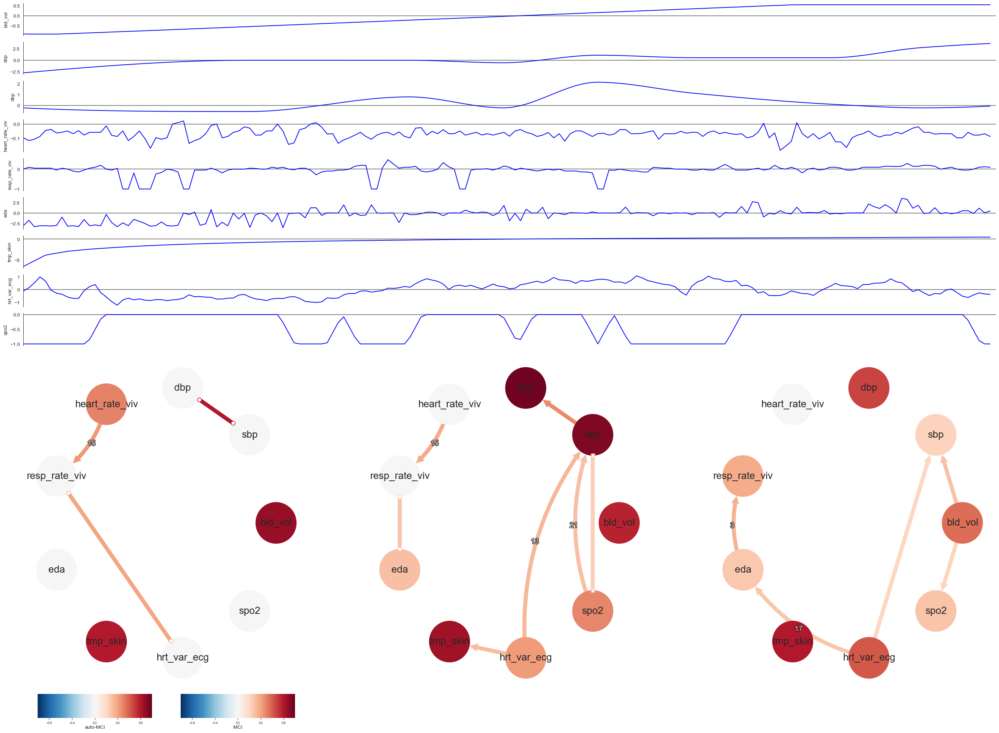

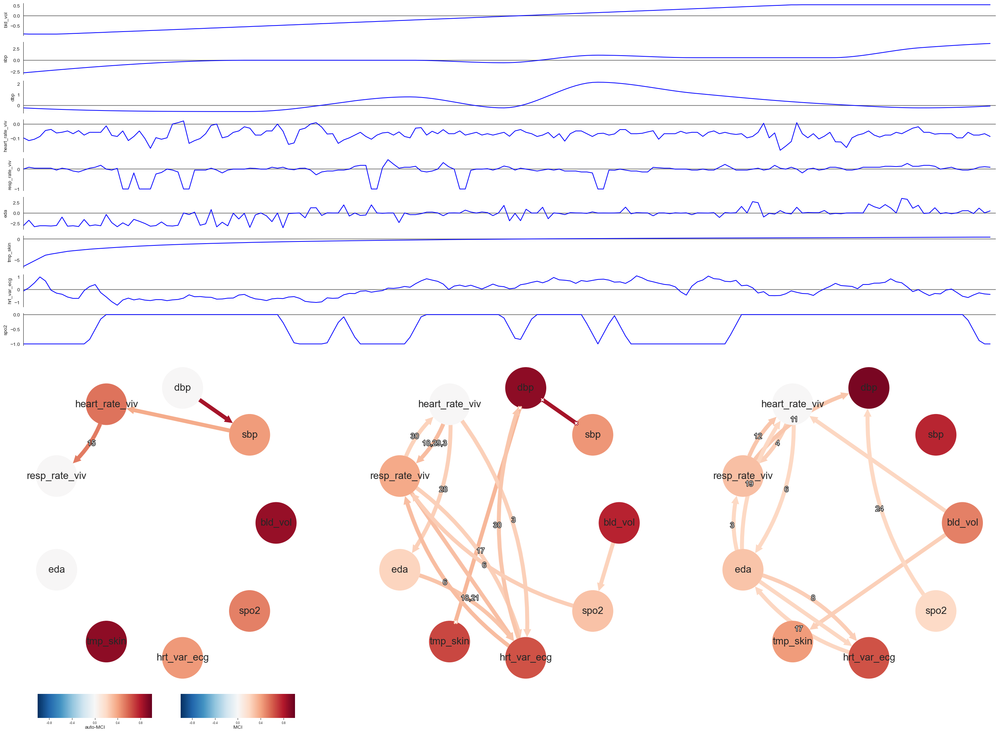

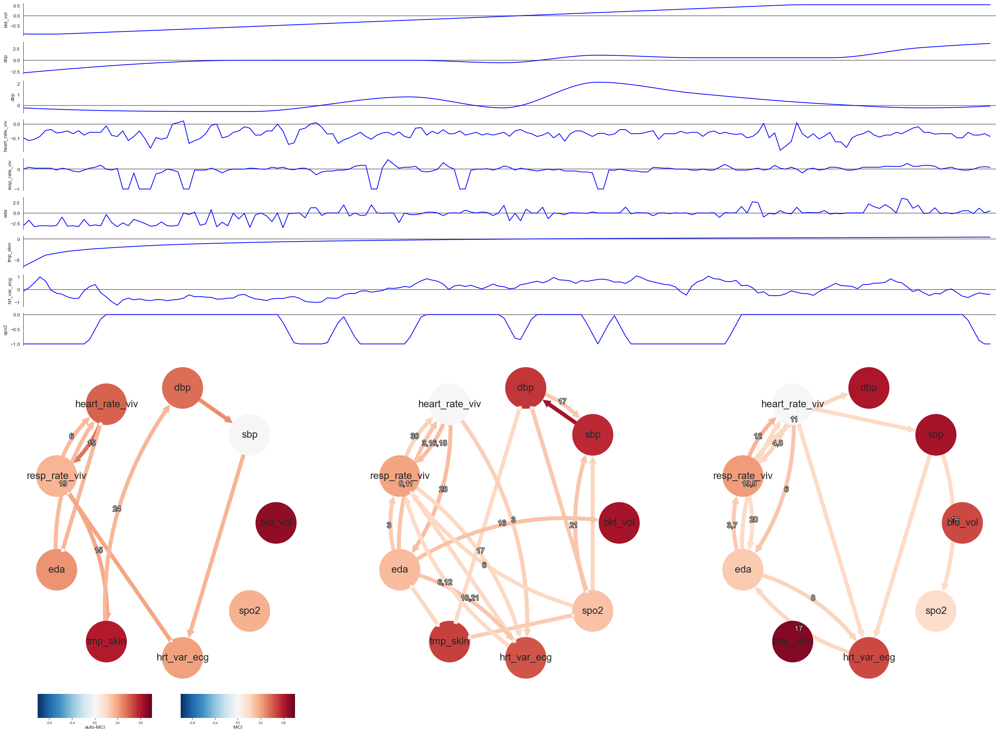

In [151]:
window_step=40
window_length=90
method='run_pcmciplus'
for pc_alpha in sig_level:
    method_args={'tau_min':0, 'tau_max':30, 'pc_alpha':pc_alpha, 'link_assumptions':link_assumptions}
    conf_lev = 0.95
    # Run
    results_603 = pcmci_gpdc_603.run_sliding_window_of(method=method,
                                        method_args=method_args,
                                        window_step=window_step,
                                        window_length=window_length,
                                        conf_lev = conf_lev)
    graphs_603 = results_603['window_results']['graph']
    val_matrices_603 = results_603['window_results']['val_matrix']
    n_windows = len(graphs_603)

    mosaic = [['data %s' %j for i in range(n_windows)] for j in range(9)]
    for n in range(9):
        mosaic.append(['graph %s' %i for i in range(n_windows)])
    # print(mosaic)
    fig, axs = plt.subplot_mosaic(mosaic = mosaic, figsize=(35, 25))

    for j in range(9):
        ax = axs['data %s' %j]
        ax.axhline(0., color='grey')
        color = 'blue'
        ax.plot(np.arange(patient_603.values.shape[0]), patient_603.iloc[:,j], color=color)
    #     axs['data %s' %j].axis('off') # xaxis.set_ticklabels([])
        for loc, spine in ax.spines.items():
            if loc != 'left':
                spine.set_color("none")

        ax.xaxis.set_ticks([])
        ax.set_xlim(0., patient_603.values.shape[0])
        ax.set_ylabel(var_names[j])

    for w in range(n_windows):
        if w == 0: show_colorbar=True
        else: show_colorbar = False
        tp.plot_graph(graphs_603[w], val_matrix=val_matrices_603[w], save_name = '603_sw_'+str(pc_alpha)+'.svg',
                      show_colorbar=show_colorbar, node_label_size=20, link_label_fontsize=15,
                      var_names=var_names, fig_ax=(fig, axs['graph %s' %w]))

In [ ]:
import matplotlib.pyplot as plt
graphs_603 = results_603['window_results']['graph']
val_matrices_603 = results_603['window_results']['val_matrix']
n_windows = len(graphs_603)

mosaic = [['data %s' %j for i in range(n_windows)] for j in range(9)]
for n in range(9):
    mosaic.append(['graph %s' %i for i in range(n_windows)])
# print(mosaic)
fig, axs = plt.subplot_mosaic(mosaic = mosaic, figsize=(35, 25))

for j in range(9):
    ax = axs['data %s' %j]
    ax.axhline(0., color='grey')
    color = 'blue'
    ax.plot(np.arange(patient_603.values.shape[0]), patient_603.iloc[:,j], color=color)
#     axs['data %s' %j].axis('off') # xaxis.set_ticklabels([])
    for loc, spine in ax.spines.items():
        if loc != 'left':
            spine.set_color("none")

    ax.xaxis.set_ticks([])
    ax.set_xlim(0., patient_603.values.shape[0])
    ax.set_ylabel(var_names[j])

for w in range(n_windows):
    if w == 0: show_colorbar=True
    else: show_colorbar = False
    tp.plot_graph(graphs_603[w], val_matrix=val_matrices_603[w], save_name = '603_sw_0.2.svg',
                  show_colorbar=show_colorbar, node_label_size=20, link_label_fontsize=15,
                  var_names=var_names, fig_ax=(fig, axs['graph %s' %w]))

#### Dynotears

In [76]:
from __future__ import print_function
import scipy.sparse as spx
import pandas as pd
import matplotlib.pyplot as plt
import sys
import random
import networkx as nx
import warnings
from causalnex.structure import StructureModel
from causalnex.structure.notears import from_pandas
from IPython.display import Image
from causalnex.plots import plot_structure, NODE_STYLE
import networkx as nx
from causalnex.structure.dynotears import from_pandas_dynamic 


In [77]:
patient_497 = pd.read_csv('data/497_360_int.csv')
warnings.filterwarnings("ignore")  # silence warnings
sm = StructureModel()
g_learnt = from_pandas_dynamic(patient_497,30,lambda_w=.1,lambda_a=.1,w_threshold=.1)

adj_mtrx_dyno= nx.adjacency_matrix(g_learnt)
for edge in adj_mtrx_dyno:
    print(edge)
# from scipy.sparse.linalg.eigen.arpack import eigsh, ArpackNoConvergence


  (0, 0)	0.41830882899358407











































































































































































































  (0, 186)	0.11112951274748528










  (0, 155)	0.13984831178006266
  (0, 186)	0.25814590856647757

  (0, 217)	0.9979884075485563




























































